# About Dataset
This dataset follows the format of the Retail Store Inventory Forecasting Dataset and corrects mislabeled entries such as store and product IDs. Additionally, it includes an Epidemic feature to simulate retail conditions during the COVID-19 pandemic period, enhancing the realism and practical value of the data. These improvements are aimed at making the dataset more suitable for time series forecasting tasks.

**Date**: Date of the record.  

**Store ID**: Unique identifier for the store.  

**Product ID**: Unique identifier for the product.  

**Category**: Product category.  

**Region**: Geographical region of the store.  

**Inventory Level**: Units available in stock.  

**Units Sold**: Units sold on that day.  

**Units Ordered**: Units ordered for restocking.  

**Price**: Product price.  

**Discount**: Discount applied, if any.  

**Weather Condition**: Weather on the day of the record. 

**Promotion**: 1 if there was a promotion, 0 otherwise.  

**Competitor Pricing**: Price of a similar product from a competitor.  

**Seasonality**: Season (e.g., Winter, Spring).  

**Epidemic**: 1 if an epidemic occurred, 0 otherwise.  

**Demand**: Daily estimated demand for the product  

### Importing Data Set

Data can be imported from Kaggle via an API or downloaded to a .csv file and imported with pandas

In [1]:
import pandas as pd

sales_data = pd.read_csv('sales_data.csv')

In [2]:
sales_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                76000 non-null  object 
 1   Store ID            76000 non-null  object 
 2   Product ID          76000 non-null  object 
 3   Category            76000 non-null  object 
 4   Region              76000 non-null  object 
 5   Inventory Level     76000 non-null  int64  
 6   Units Sold          76000 non-null  int64  
 7   Units Ordered       76000 non-null  int64  
 8   Price               76000 non-null  float64
 9   Discount            76000 non-null  int64  
 10  Weather Condition   76000 non-null  object 
 11  Promotion           76000 non-null  int64  
 12  Competitor Pricing  76000 non-null  float64
 13  Seasonality         76000 non-null  object 
 14  Epidemic            76000 non-null  int64  
 15  Demand              76000 non-null  int64  
dtypes: f

### Add columns and change variable types

In [3]:
# Convert 'Date' to datetime format if it isn't already
sales_data['Date'] = pd.to_datetime(sales_data['Date'])

# Add 'Year' column to dataframe
sales_data['Year'] = sales_data['Date'].dt.year

# Add 'Month' column to dataframe
sales_data['Month'] = sales_data['Date'].dt.month

# Create 'Week Ending' (Sunday of each week)
sales_data['Week Ending'] = sales_data['Date'] + pd.offsets.Week(weekday=6)

# Create 'Month Ending' (last day of the month)
sales_data['Month Ending'] = sales_data['Date'] + pd.offsets.MonthEnd(0)

# Create 'Month Name' (abbreviation of month name rather than 1-12)
sales_data['Month Name'] = sales_data['Date'].dt.strftime('%b')

# Set the order for each month
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

In [4]:
sales_data

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Price,Discount,Weather Condition,Promotion,Competitor Pricing,Seasonality,Epidemic,Demand,Year,Month,Week Ending,Month Ending,Month Name
0,2022-01-01,S001,P0001,Electronics,North,195,102,252,72.72,5,Snowy,0,85.73,Winter,0,115,2022,1,2022-01-02,2022-01-31,Jan
1,2022-01-01,S001,P0002,Clothing,North,117,117,249,80.16,15,Snowy,1,92.02,Winter,0,229,2022,1,2022-01-02,2022-01-31,Jan
2,2022-01-01,S001,P0003,Clothing,North,247,114,612,62.94,10,Snowy,1,60.08,Winter,0,157,2022,1,2022-01-02,2022-01-31,Jan
3,2022-01-01,S001,P0004,Electronics,North,139,45,102,87.63,10,Snowy,0,85.19,Winter,0,52,2022,1,2022-01-02,2022-01-31,Jan
4,2022-01-01,S001,P0005,Groceries,North,152,65,271,54.41,0,Snowy,0,51.63,Winter,0,59,2022,1,2022-01-02,2022-01-31,Jan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,2024-01-30,S005,P0016,Toys,North,233,63,0,29.80,5,Snowy,0,32.23,Winter,0,64,2024,1,2024-02-04,2024-01-31,Jan
75996,2024-01-30,S005,P0017,Toys,North,137,115,141,42.92,5,Snowy,0,40.73,Winter,0,137,2024,1,2024-02-04,2024-01-31,Jan
75997,2024-01-30,S005,P0018,Clothing,North,197,44,0,17.81,10,Snowy,0,19.41,Winter,0,68,2024,1,2024-02-04,2024-01-31,Jan
75998,2024-01-30,S005,P0019,Furniture,North,125,58,0,151.72,0,Snowy,0,143.71,Winter,0,84,2024,1,2024-02-04,2024-01-31,Jan


In [5]:
pivot_df = sales_data.pivot_table(
    values='Units Sold',
    index='Category',
    columns='Month Name',
    aggfunc='mean'
)

# Reorder the columns using reindex
pivot_df = pivot_df.reindex(columns=month_order)

pivot_df

Month Name,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
Category,,,,,,,,,,,,
Clothing,105.300272,107.889509,89.686492,90.612500,91.594758,89.380208,90.420363,91.123992,88.978125,90.450605,89.564583,106.207661
Electronics,83.228261,72.090774,92.192204,73.625000,68.452957,91.093056,74.463710,93.177419,89.638889,76.211022,91.620833,89.994624
Furniture,65.840580,54.153770,73.492832,55.177778,49.120968,69.946296,56.907706,73.812724,72.235185,60.503584,71.514815,68.465950
Groceries,98.854891,88.708482,107.901613,90.352500,84.537097,123.722083,108.993952,126.683871,104.695417,93.694758,104.016250,103.251210
Toys,79.394410,58.605867,107.222350,72.073810,60.192396,85.665476,62.949309,87.899770,87.994048,68.188940,86.354762,83.038018


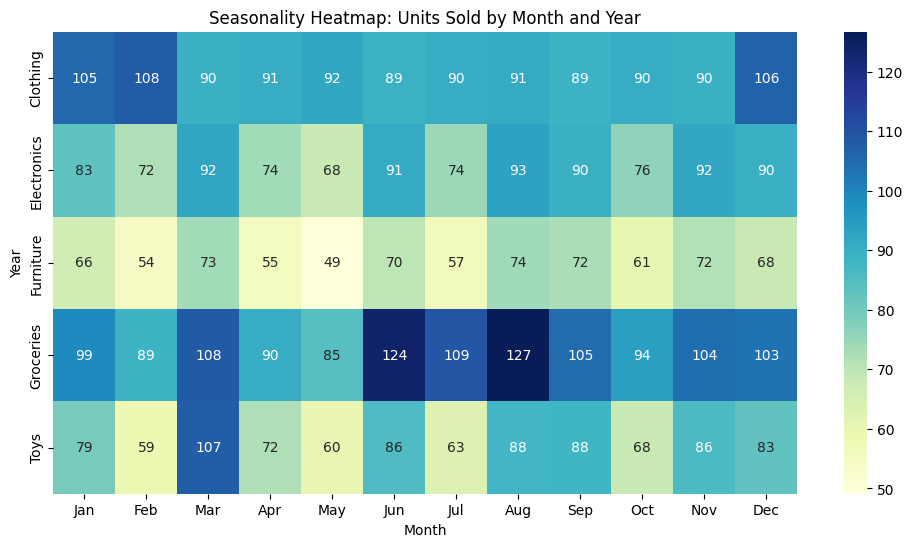

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_df, annot=True, fmt=".0f", cmap='YlGnBu')
plt.title('Seasonality Heatmap: Units Sold by Month and Year')
plt.xlabel('Month')
plt.ylabel('Year')
plt.show()


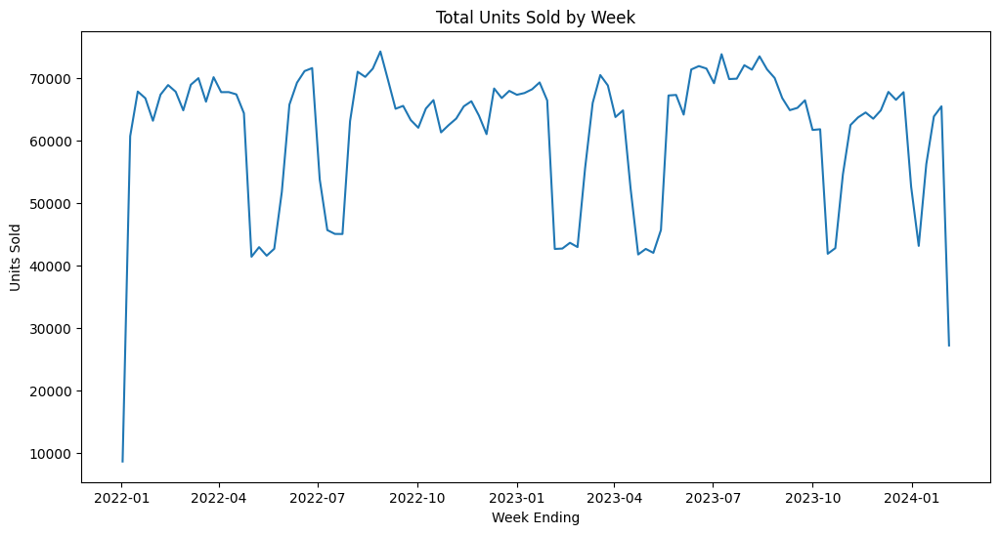

In [7]:
sales_by_week= sales_data.groupby('Week Ending')['Units Sold'].sum().reset_index()

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
sns.lineplot(data=sales_by_week, x='Week Ending', y='Units Sold')
plt.title('Total Units Sold by Week')
plt.show()


In [8]:
import plotly.express as px


sales_pivot = sales_data.pivot_table(index='Store ID', columns='Category', values='Units Sold', aggfunc='mean')

fig = px.imshow(sales_pivot,
                labels=dict(x="Category", y="Store ID", color="Avg Sales"),
                title="Average Sales Heatmap by Store and Item")
fig.show()


In [9]:
fig = px.histogram(sales_data, x='Units Sold', nbins=50, title='Sales Distribution')
fig.show()


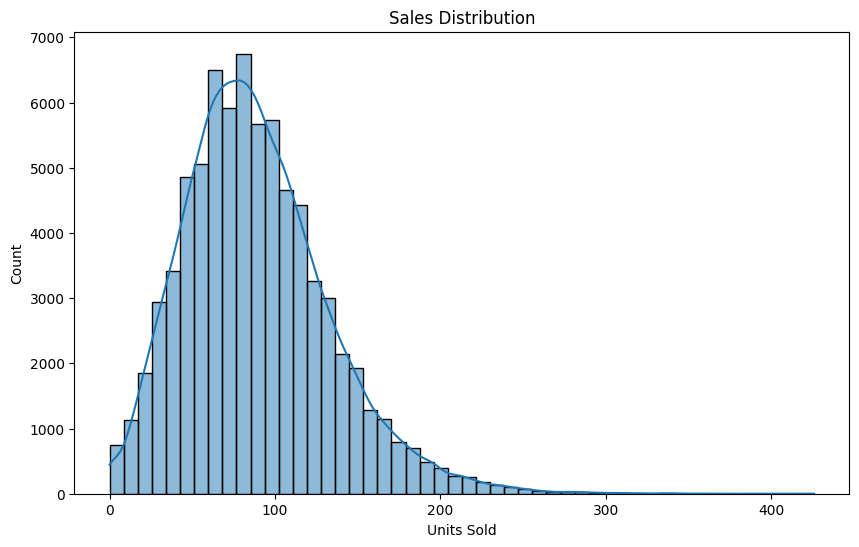

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt



plt.figure(figsize=(10,6))
sns.histplot(sales_data['Units Sold'], bins=50, kde=True)
plt.title('Sales Distribution')
plt.show()



In [11]:
sales_by_day= sales_data.groupby('Date')['Units Sold'].sum().reset_index()

In [12]:
sales_data.groupby(['Date', 'Epidemic'])['Units Sold'].sum()

Date        Epidemic
2022-01-01  0           8601
2022-01-02  0           7684
2022-01-03  0           5965
2022-01-04  0           7859
2022-01-05  0           9621
                        ... 
2024-01-26  0           9184
2024-01-27  0           9598
2024-01-28  0           9942
2024-01-29  0           8802
2024-01-30  0           8425
Name: Units Sold, Length: 760, dtype: int64

/var/folders/kv/p51lb8j91hq1tf9wl5pmdd2m0000gn/T/ipykernel_15242/3552688309.py:6: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



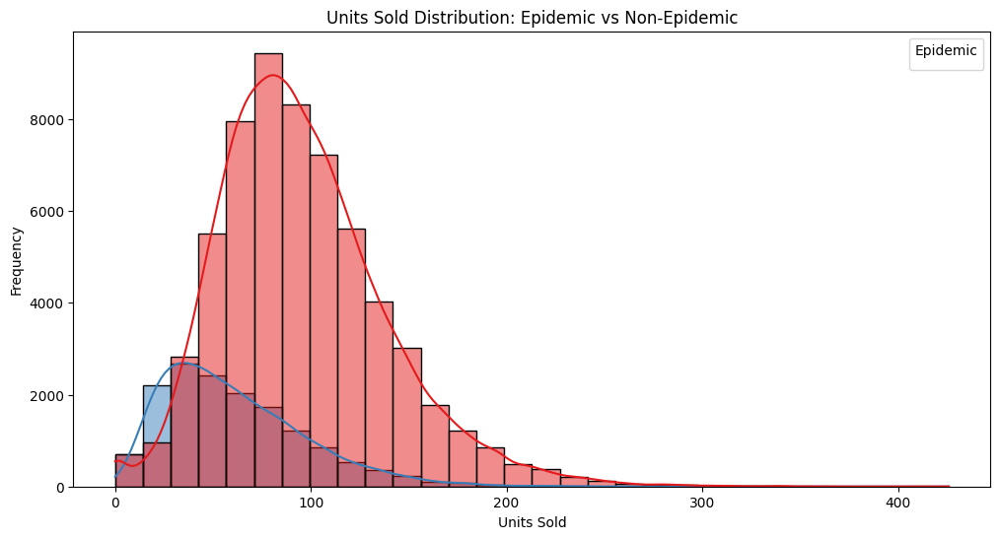

In [13]:
plt.figure(figsize=(12,6))
sns.histplot(data=sales_data, x='Units Sold', hue='Epidemic', kde=True, bins=30, palette='Set1')
plt.title('Units Sold Distribution: Epidemic vs Non-Epidemic')
plt.xlabel('Units Sold')
plt.ylabel('Frequency')
plt.legend(title='Epidemic')
plt.show()

In [14]:
daily_sales = sales_data.groupby(['Date', 'Epidemic'])['Units Sold'].sum().reset_index()


<Figure size 1400x600 with 0 Axes>

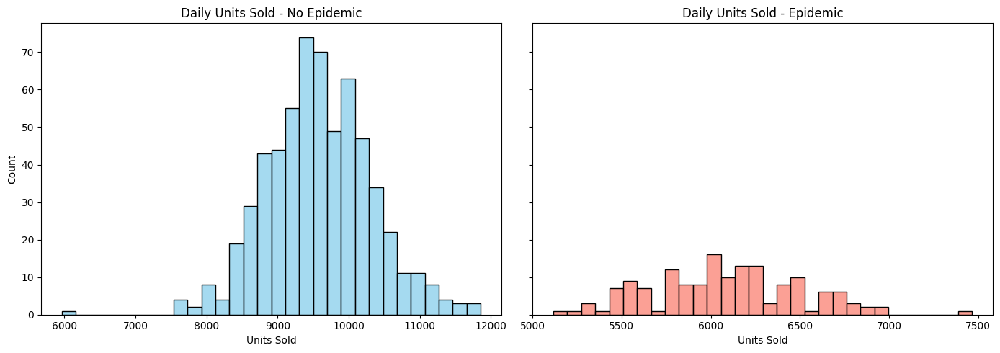

In [15]:
plt.figure(figsize=(14,6))

# Subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# No Epidemic
sns.histplot(daily_sales[daily_sales['Epidemic'] == 0]['Units Sold'],
             bins=30, ax=axes[0], color='skyblue')
axes[0].set_title('Daily Units Sold - No Epidemic')
axes[0].set_xlabel('Units Sold')

# Epidemic
sns.histplot(daily_sales[daily_sales['Epidemic'] == 1]['Units Sold'],
             bins=30, ax=axes[1], color='salmon')
axes[1].set_title('Daily Units Sold - Epidemic')
axes[1].set_xlabel('Units Sold')

plt.tight_layout()
plt.show()

/var/folders/kv/p51lb8j91hq1tf9wl5pmdd2m0000gn/T/ipykernel_15242/299793237.py:6: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



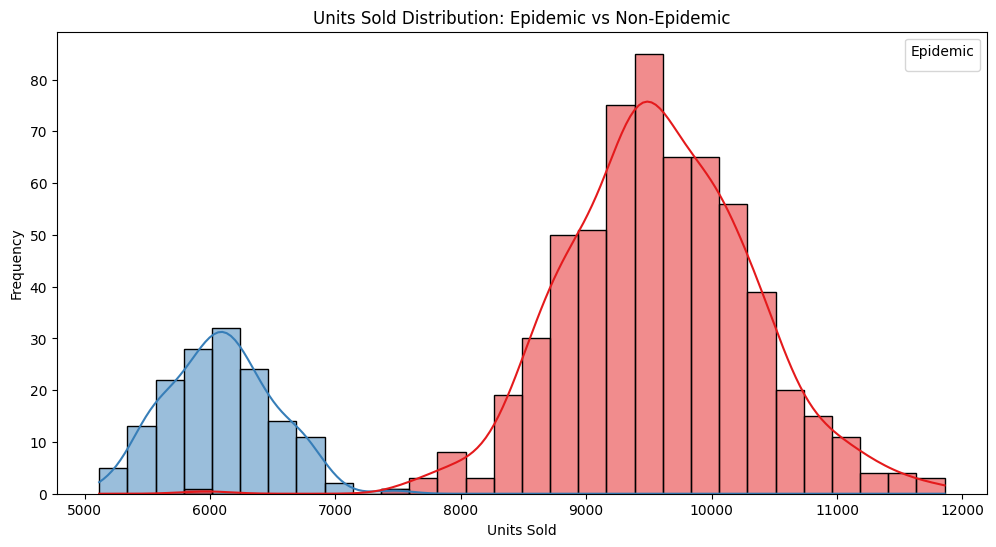

In [16]:
plt.figure(figsize=(12,6))
sns.histplot(data=daily_sales, x='Units Sold', hue='Epidemic', kde=True, bins=30, palette='Set1')
plt.title('Units Sold Distribution: Epidemic vs Non-Epidemic')
plt.xlabel('Units Sold')
plt.ylabel('Frequency')
plt.legend(title='Epidemic')
plt.show()

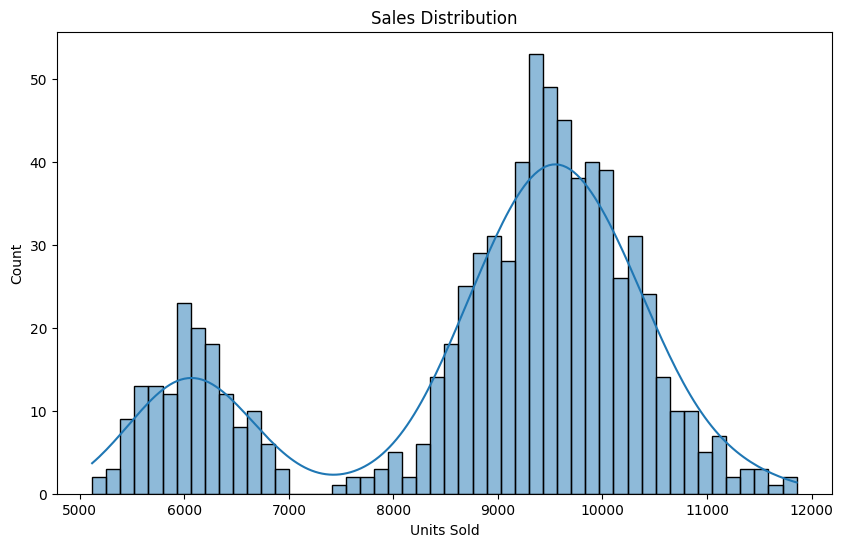

In [17]:
plt.figure(figsize=(10,6))
sns.histplot(sales_by_day['Units Sold'], bins=50, kde=True)
plt.title('Sales Distribution')
plt.show()


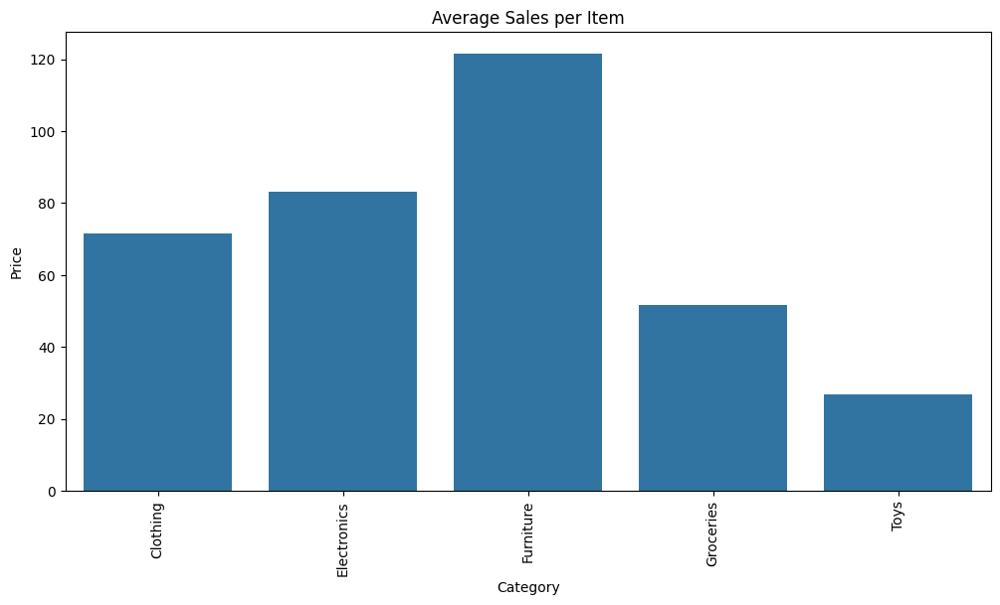

In [18]:
avg_sales_item = sales_data.groupby('Category')['Price'].mean().reset_index()

plt.figure(figsize=(12,6))
sns.barplot(x='Category', y='Price', data=avg_sales_item)
plt.title('Average Sales per Item')
plt.xticks(rotation=90)
plt.show()


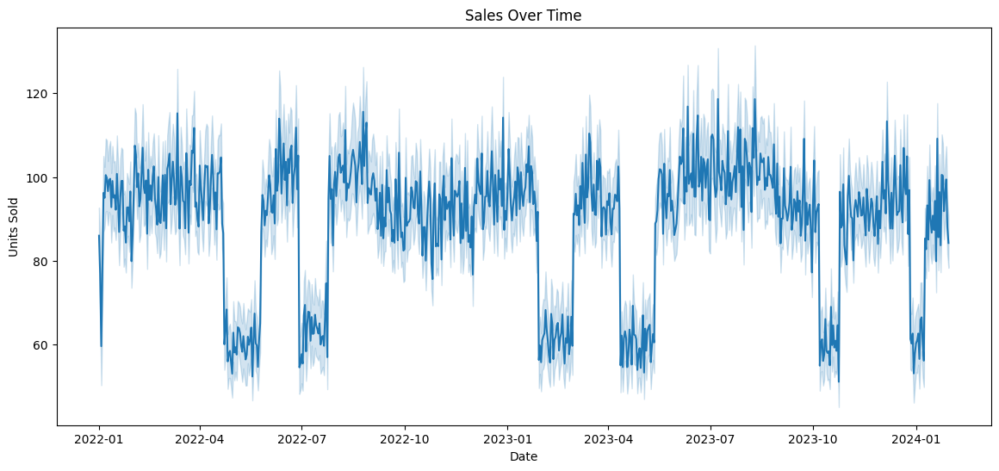

In [19]:
sales_data['Date'] = pd.to_datetime(sales_data['Date'])

plt.figure(figsize=(14,6))
sns.lineplot(x='Date', y='Units Sold', data=sales_data)
plt.title('Sales Over Time')
plt.show()


In [20]:
import plotly.graph_objects as go

# Your pivot table
pivot_df = sales_data.pivot_table(index='Store ID', columns='Weather Condition', values='Units Sold', aggfunc='mean')

# Build surface plot
fig = go.Figure(data=[go.Surface(
    z=pivot_df.values,
    x=pivot_df.columns,
    y=pivot_df.index
)])

fig.update_layout(
    title='Average Units Sold Surface Plot (Store vs Category)',
    width=1200,  # pixels
    height=1000,
    scene=dict(
        xaxis_title='Weather Condition',
        yaxis_title='Store ID',
        zaxis_title='Avg Units Sold'
    )
)

fig.show()


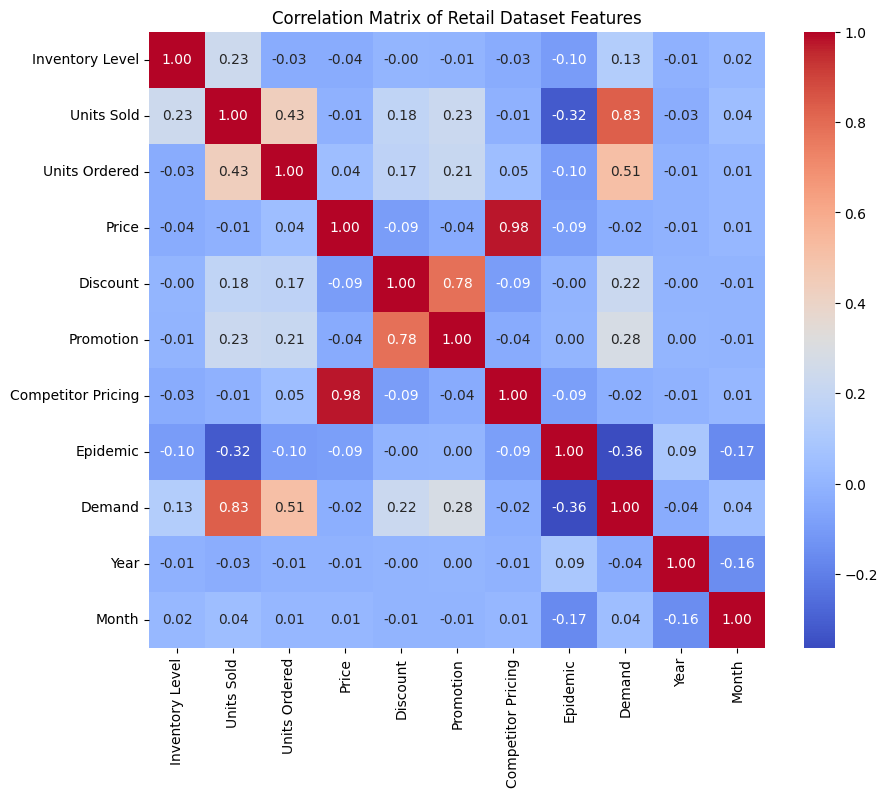

In [21]:
# Pick only numeric columns for correlation (exclude Date, IDs if needed)
numeric_df = sales_data.select_dtypes(include='number')

# Correlation matrix
corr_matrix = numeric_df.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Correlation Matrix of Retail Dataset Features')
plt.show()

In [22]:
# Correlation matrix, rounded to 2 decimal places
corr_matrix = numeric_df.corr().round(2)

# Plotly interactive heatmap
fig = px.imshow(corr_matrix, 
                text_auto=".2f",  # display values to 2 decimal places
                color_continuous_scale='RdBu_r',
                title='Correlation Matrix Heatmap',
                width=1000,   # <-- increase width
                height=800   # <-- increase height
               )

# Update layout for better font size and axis labels
fig.update_layout(
    font=dict(size=14),
    xaxis_title="Features",
    yaxis_title="Features",
    margin=dict(l=60, r=60, t=80, b=60)
)

fig.show()

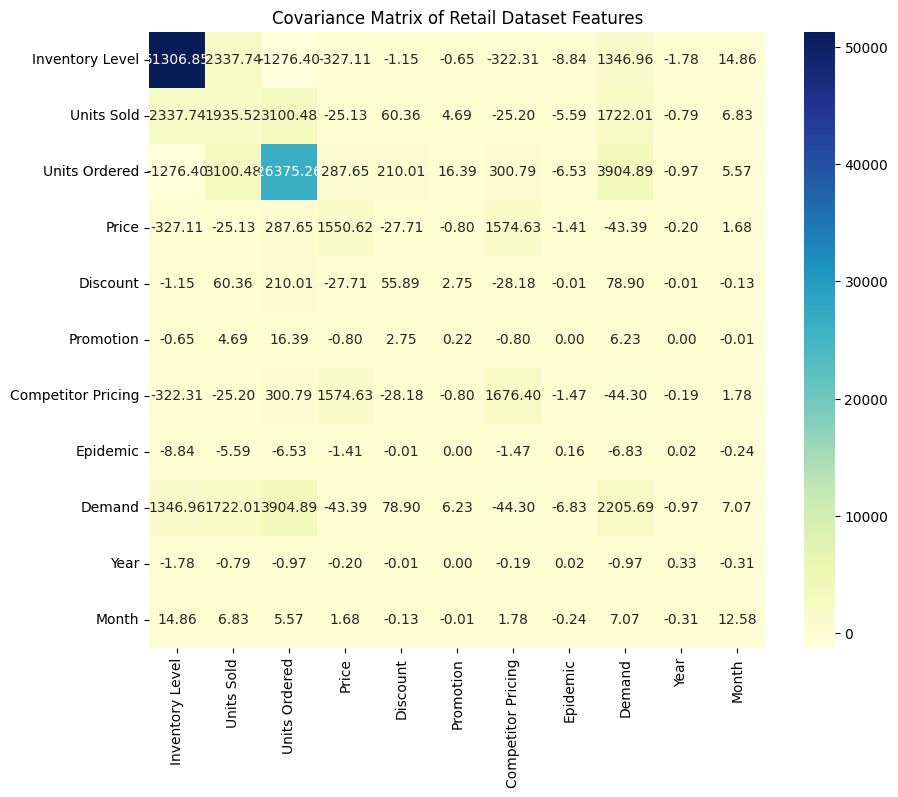

In [23]:
# Compute covariance matrix
cov_matrix = numeric_df.cov().round(2)

# Heatmap for covariance
plt.figure(figsize=(10, 8))
sns.heatmap(cov_matrix, annot=True, fmt=".2f", cmap='YlGnBu', square=True)
plt.title('Covariance Matrix of Retail Dataset Features')
plt.show()

In [24]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px
import pandas as pd

# Standardize the data (important for PCA)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_df)

# Run PCA
pca = PCA(n_components=5)
pca_result = pca.fit_transform(scaled_data)

# Put results in DataFrame
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2', 'PC3', 
                                                'PC4', 'PC5'])

# 3D Scatter plot of the first 3 principal components
fig = px.scatter_3d(pca_df, x='PC1', y='PC2', z='PC3', 
                    title='3D PCA Projection',
                    width=1000, height=800)
fig.show()

# Variance explained by each component
print("Explained variance ratio:", pca.explained_variance_ratio_)


Explained variance ratio: [0.2452592  0.18524756 0.14040141 0.10679391 0.09152487]


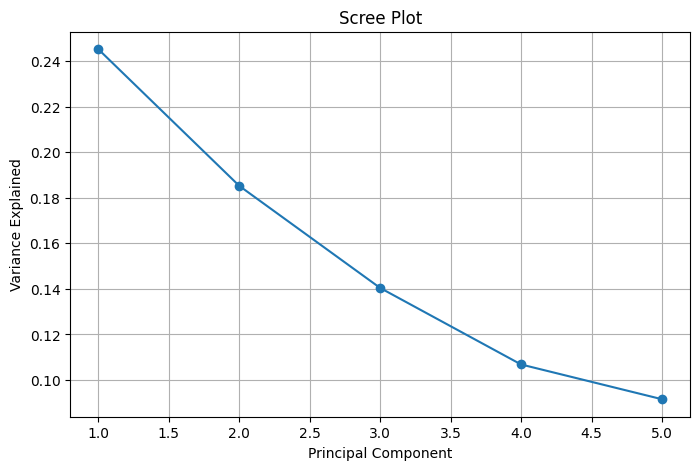

In [25]:
import matplotlib.pyplot as plt

# Scree plot
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_, marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.title('Scree Plot')
plt.grid(True)
plt.show()


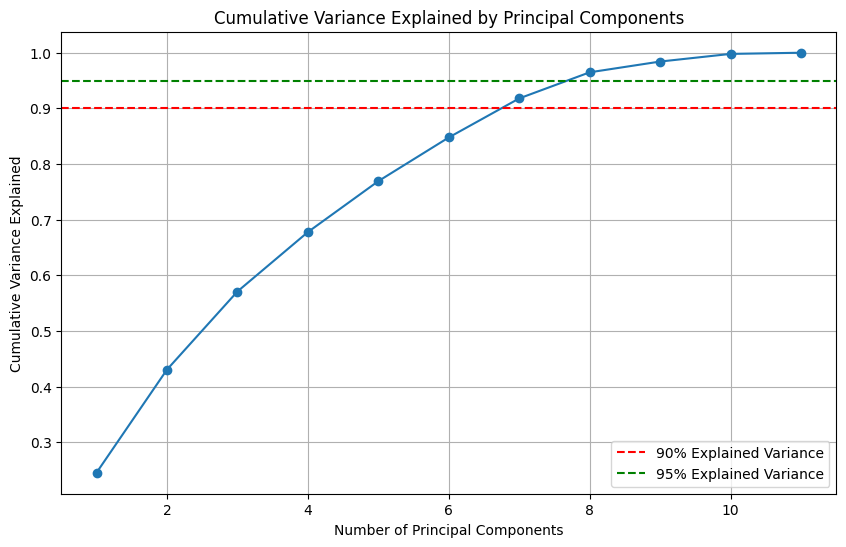

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Standardize numeric data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_df)

# Run PCA
pca = PCA()
pca_result = pca.fit(scaled_data)

# Variance ratios
var_explained = pca.explained_variance_ratio_
cumulative_var = np.cumsum(var_explained)

# Plot cumulative variance explained
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_var)+1), cumulative_var, marker='o', linestyle='-')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Variance Explained by Principal Components')
plt.grid(True)

# Optional: Add a horizontal line at 90% or 95%
plt.axhline(y=0.9, color='r', linestyle='--', label='90% Explained Variance')
plt.axhline(y=0.95, color='g', linestyle='--', label='95% Explained Variance')
plt.legend()

plt.show()


Inventory Level       0
Units Sold            0
Units Ordered         0
Price                 0
Discount              0
Promotion             0
Competitor Pricing    0
Epidemic              0
Demand                0
dtype: int64

🔍 Without PCA -> MSE: 541.93, R²: 0.72

📊 Number of Principal Components kept: 5

🔍 With PCA -> MSE: 780.89, R²: 0.59


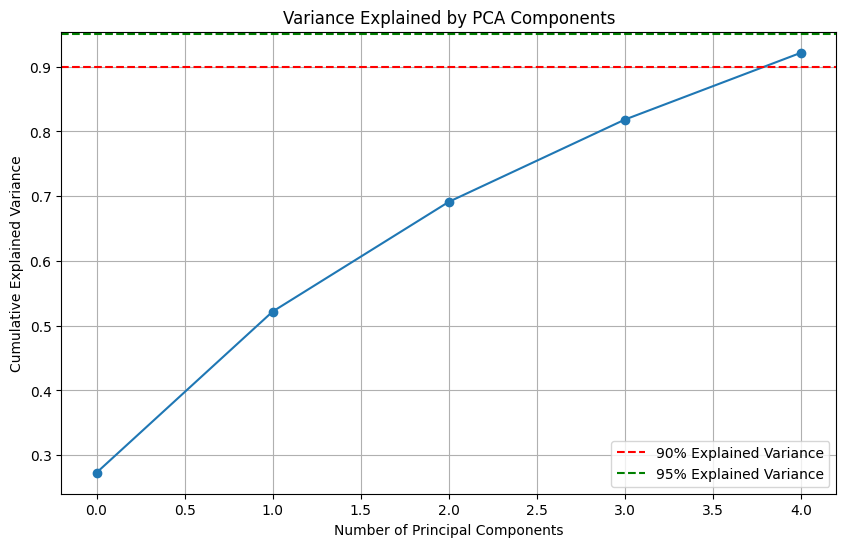


📄 PCA Loadings:
                      PC1    PC2    PC3    PC4    PC5
Inventory Level     0.060 -0.005 -0.306  0.825  0.453
Units Ordered       0.339  0.249 -0.252 -0.469  0.485
Price              -0.266  0.633  0.149  0.061  0.040
Discount            0.519  0.090  0.423  0.183 -0.132
Promotion           0.524  0.139  0.407  0.151 -0.082
Competitor Pricing -0.264  0.633  0.149  0.063  0.040
Epidemic           -0.130 -0.229  0.517 -0.145  0.725
Demand              0.425  0.241 -0.432 -0.120  0.083


In [27]:
# 📦 Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# 📄 Load Data
df = pd.read_csv('sales_data.csv')  # Adjust path if needed

# 📊 Select numeric columns and define target
numeric_df = df.select_dtypes(include='number')
X = numeric_df.drop(columns=['Units Sold'])  # Features
y = numeric_df['Units Sold']                 # Target

# 🔍 Check for missing values (optional)
print(numeric_df.isnull().sum())

# ⚙️ Standardize Features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 📤 Split Data into Train/Test Sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 📈 Linear Regression WITHOUT PCA
model1 = LinearRegression()
model1.fit(X_train, y_train)
y_pred1 = model1.predict(X_test)

# 📊 Metrics without PCA
mse1 = mean_squared_error(y_test, y_pred1)
r2_1 = r2_score(y_test, y_pred1)
print(f'\n🔍 Without PCA -> MSE: {mse1:.2f}, R²: {r2_1:.2f}')

# 📉 Apply PCA (keep 90% variance)
pca = PCA(n_components=0.9)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

print(f'\n📊 Number of Principal Components kept: {pca.n_components_}')

# 📈 Linear Regression WITH PCA
model2 = LinearRegression()
model2.fit(X_train_pca, y_train)
y_pred2 = model2.predict(X_test_pca)

# 📊 Metrics with PCA
mse2 = mean_squared_error(y_test, y_pred2)
r2_2 = r2_score(y_test, y_pred2)
print(f'\n🔍 With PCA -> MSE: {mse2:.2f}, R²: {r2_2:.2f}')

# 📊 Plot Cumulative Variance Explained
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='-')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Variance Explained by PCA Components')
plt.axhline(y=0.9, color='r', linestyle='--', label='90% Explained Variance')
plt.axhline(y=0.95, color='g', linestyle='--', label='95% Explained Variance')
plt.grid(True)
plt.legend()
plt.show()

# 📊 Optional: Print individual component loadings
loadings_df = pd.DataFrame(pca.components_.T,
                           columns=[f'PC{i+1}' for i in range(pca.n_components_)],
                           index=X.columns)
print("\n📄 PCA Loadings:")
print(loadings_df.round(3))



🌲 Without PCA -> MSE: 338.50, R²: 0.82

📊 Number of Principal Components kept: 5

🌲 With PCA -> MSE: 400.89, R²: 0.79


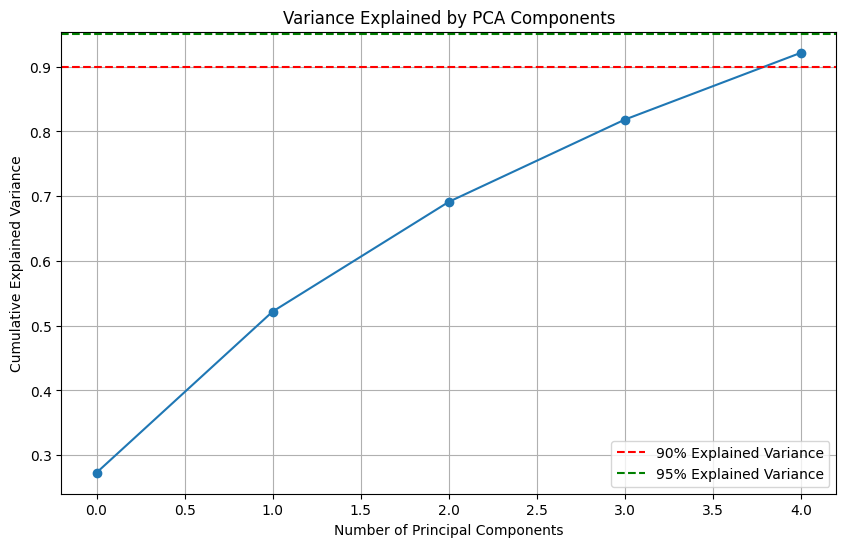


📄 PCA Loadings:
                      PC1    PC2    PC3    PC4    PC5
Inventory Level     0.060 -0.005 -0.306  0.825  0.453
Units Ordered       0.339  0.249 -0.252 -0.469  0.485
Price              -0.266  0.633  0.149  0.061  0.040
Discount            0.519  0.090  0.423  0.183 -0.132
Promotion           0.524  0.139  0.407  0.151 -0.082
Competitor Pricing -0.264  0.633  0.149  0.063  0.040
Epidemic           -0.130 -0.229  0.517 -0.145  0.725
Demand              0.425  0.241 -0.432 -0.120  0.083


In [28]:
# 📦 Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# 📄 Load Data
#df = pd.read_csv('data/Retail_Inventory_Stock.csv')  # Adjust path if needed

# 📊 Select numeric columns and define target
numeric_df = df.select_dtypes(include='number')
X = numeric_df.drop(columns=['Units Sold'])  # Features
y = numeric_df['Units Sold']                 # Target

# ⚙️ Standardize Features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 📤 Split Data into Train/Test Sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 🌲 Random Forest WITHOUT PCA
rf1 = RandomForestRegressor(n_estimators=100, random_state=42)
rf1.fit(X_train, y_train)
y_pred_rf1 = rf1.predict(X_test)

# 📊 Metrics without PCA
mse_rf1 = mean_squared_error(y_test, y_pred_rf1)
r2_rf1 = r2_score(y_test, y_pred_rf1)
print(f'\n🌲 Without PCA -> MSE: {mse_rf1:.2f}, R²: {r2_rf1:.2f}')

# 📉 Apply PCA (keep 90% variance)
pca = PCA(n_components=0.9)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

print(f'\n📊 Number of Principal Components kept: {pca.n_components_}')

# 🌲 Random Forest WITH PCA
rf2 = RandomForestRegressor(n_estimators=100, random_state=42)
rf2.fit(X_train_pca, y_train)
y_pred_rf2 = rf2.predict(X_test_pca)

# 📊 Metrics with PCA
mse_rf2 = mean_squared_error(y_test, y_pred_rf2)
r2_rf2 = r2_score(y_test, y_pred_rf2)
print(f'\n🌲 With PCA -> MSE: {mse_rf2:.2f}, R²: {r2_rf2:.2f}')

# 📊 Plot Cumulative Variance Explained
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='-')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Variance Explained by PCA Components')
plt.axhline(y=0.9, color='r', linestyle='--', label='90% Explained Variance')
plt.axhline(y=0.95, color='g', linestyle='--', label='95% Explained Variance')
plt.grid(True)
plt.legend()
plt.show()

# 📄 PCA Loadings (optional)
loadings_df = pd.DataFrame(pca.components_.T,
                           columns=[f'PC{i+1}' for i in range(pca.n_components_)],
                           index=X.columns)
print("\n📄 PCA Loadings:")
print(loadings_df.round(3))


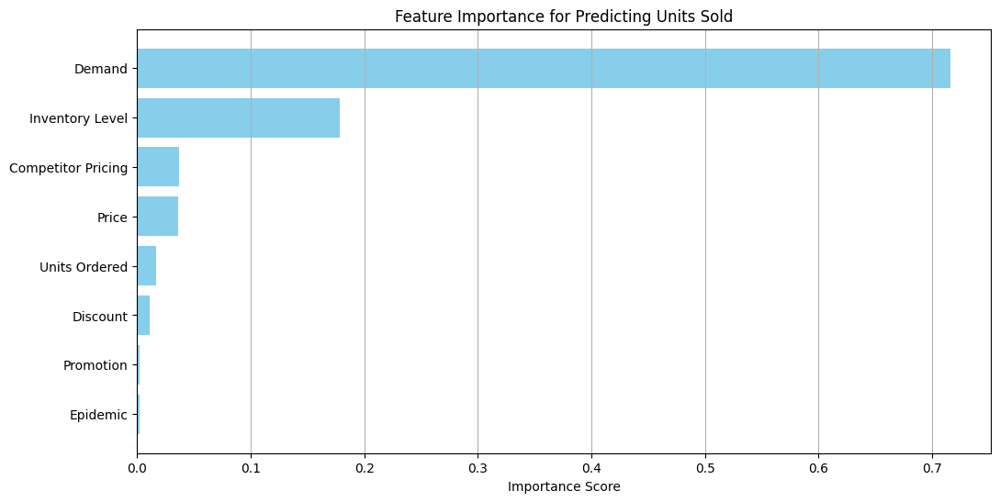


📊 Top Features:
              Feature  Importance
7              Demand    0.716075
0     Inventory Level    0.178642
5  Competitor Pricing    0.036647
2               Price    0.036212
1       Units Ordered    0.016482
3            Discount    0.011194
4           Promotion    0.002518
6            Epidemic    0.002230


In [29]:
# 📊 Feature Importance from RandomForest (without PCA)
importances = rf1.feature_importances_
features = X.columns

# 📄 Create a DataFrame for easy viewing
importance_df = pd.DataFrame({'Feature': features, 'Importance': importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# 📈 Plot
plt.figure(figsize=(12, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Importance Score')
plt.title('Feature Importance for Predicting Units Sold')
plt.gca().invert_yaxis()  # Highest importance at top
plt.grid(axis='x')
plt.show()

# 📃 Print top N features (optional)
print("\n📊 Top Features:")
print(importance_df.head(10))


Random Forest MSE: 338.52
Random Forest R²: 0.82
Decision Tree MSE: 519.00
Decision Tree R²: 0.73


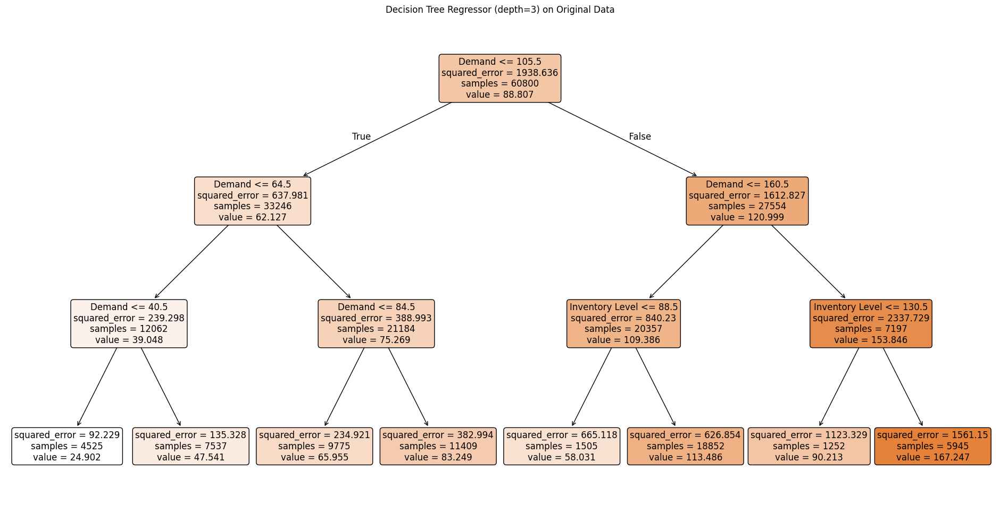

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, r2_score

# Load the dataset (adjust path as needed)
df = pd.read_csv('sales_data.csv')

# Select numeric features and target
numeric_df = df.select_dtypes(include='number')
X = numeric_df.drop(columns=['Units Sold'])
y = numeric_df['Units Sold']

# Split into train and test sets (no scaling)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Random Forest on original data
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Predict and evaluate RF
y_pred_rf = rf.predict(X_test)
print(f'Random Forest MSE: {mean_squared_error(y_test, y_pred_rf):.2f}')
print(f'Random Forest R²: {r2_score(y_test, y_pred_rf):.2f}')

# Train a single Decision Tree (for visualization) on original data
dt = DecisionTreeRegressor(max_depth=3, random_state=42)
dt.fit(X_train, y_train)

# Predict and evaluate DT
y_pred_dt = dt.predict(X_test)
print(f'Decision Tree MSE: {mean_squared_error(y_test, y_pred_dt):.2f}')
print(f'Decision Tree R²: {r2_score(y_test, y_pred_dt):.2f}')

# Plot the Decision Tree
plt.figure(figsize=(24, 12))
plot_tree(dt,
          feature_names=X.columns,
          filled=True,
          rounded=True,
          fontsize=12)
plt.title("Decision Tree Regressor (depth=3) on Original Data")
plt.show()


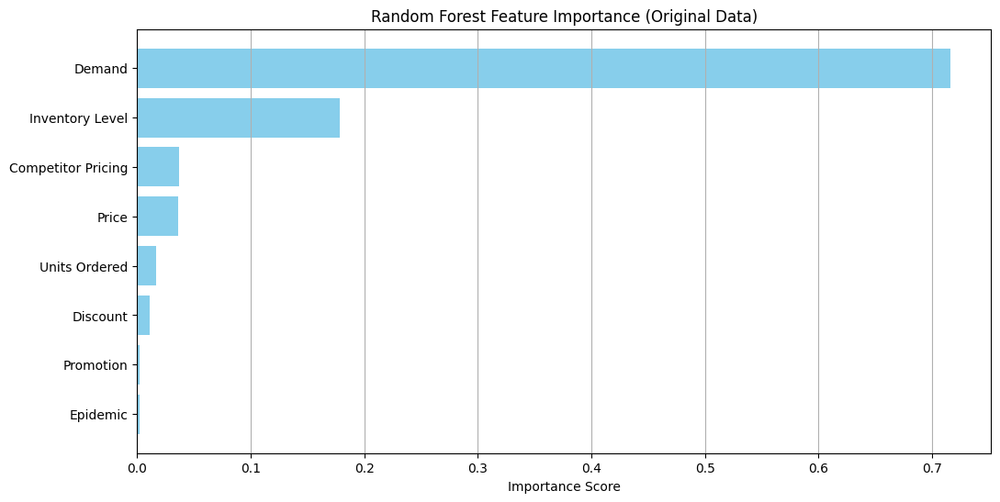

Top Features:
              Feature  Importance
7              Demand    0.716075
0     Inventory Level    0.178642
5  Competitor Pricing    0.036647
2               Price    0.036212
1       Units Ordered    0.016482
3            Discount    0.011194
4           Promotion    0.002518
6            Epidemic    0.002230


In [31]:
import pandas as pd
import matplotlib.pyplot as plt

# Get feature importances from the trained Random Forest
importances = rf.feature_importances_
features = X.columns

# Create a DataFrame for easier handling
importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(12, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Importance Score')
plt.title('Random Forest Feature Importance (Original Data)')
plt.gca().invert_yaxis()  # Highest importance on top
plt.grid(axis='x')
plt.show()

# Print top features
print("Top Features:")
print(importance_df.head(10))


/var/folders/kv/p51lb8j91hq1tf9wl5pmdd2m0000gn/T/ipykernel_15242/2837440867.py:7: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.



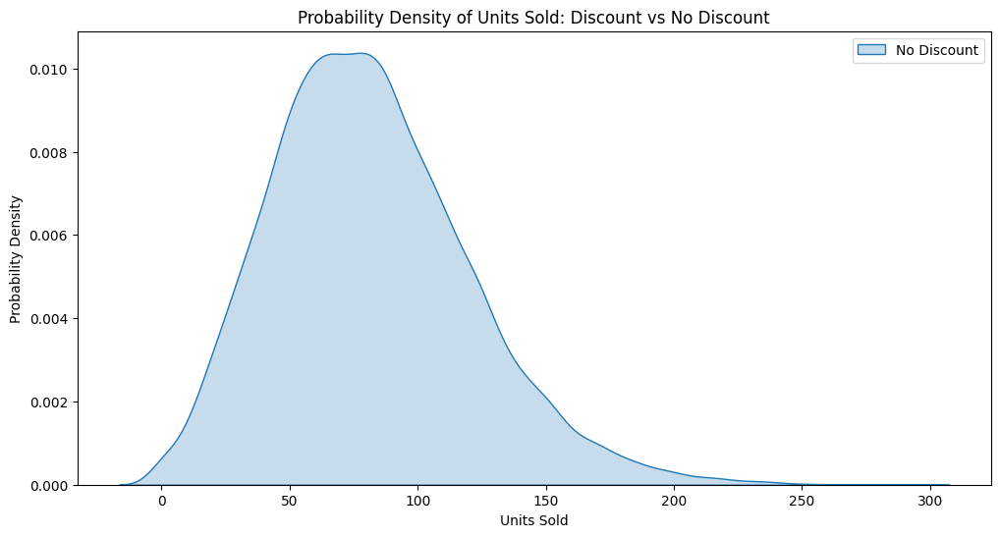

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))

sns.kdeplot(data=sales_data[sales_data['Discount'] == 0], x='Units Sold', label='No Discount', fill=True)
sns.kdeplot(data=sales_data[sales_data['Discount'] == 1], x='Units Sold', label='Discount', fill=True)

plt.title('Probability Density of Units Sold: Discount vs No Discount')
plt.xlabel('Units Sold')
plt.ylabel('Probability Density')
plt.legend()
plt.show()


In [33]:
import pandas as pd
import plotly.express as px

# Create bins and define clean labels
bins = [0, 25, 50, 75, 100, 200]
labels = ['0-25', '26-50', '51-75', '76-100', '101-200']

# Create new binned column with labels
sales_data['Units Sold Bin'] = pd.cut(sales_data['Units Sold'], bins=bins, labels=labels, include_lowest=True)

# Get counts per bin and discount status
bin_counts = sales_data.groupby(['Units Sold Bin', 'Discount']).size().reset_index(name='Count')

# Convert counts to probabilities within each Discount group
bin_counts['Prob'] = bin_counts.groupby('Discount')['Count'].transform(lambda x: x / x.sum())

# Ensure bin order
bin_counts['Units Sold Bin'] = pd.Categorical(bin_counts['Units Sold Bin'], categories=labels, ordered=True)

# Plot
fig = px.bar(bin_counts, 
             x='Units Sold Bin', 
             y='Prob', 
             color='Discount', 
             barmode='group',
             labels={'Prob':'Probability', 'Units Sold Bin':'Units Sold Bin'})
fig.update_layout(title='Probability of Units Sold by Discount Status')
fig.show()



/var/folders/kv/p51lb8j91hq1tf9wl5pmdd2m0000gn/T/ipykernel_15242/3071888227.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



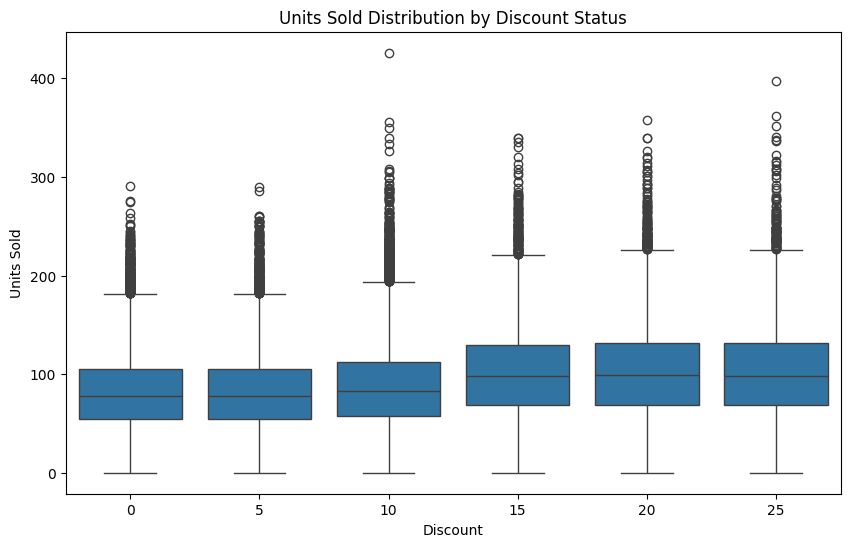

In [34]:
plt.figure(figsize=(10,6))
sns.boxplot(data=sales_data, x='Discount', y='Units Sold')
plt.title('Units Sold Distribution by Discount Status')
plt.xlabel('Discount')
plt.ylabel('Units Sold')
plt.show()


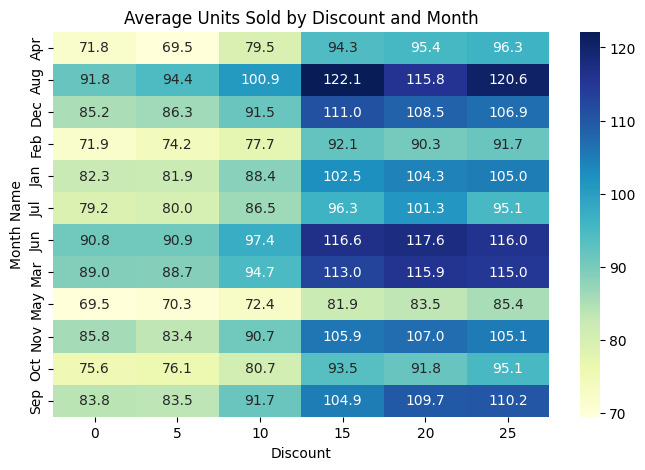

In [35]:
pivot_df = sales_data.pivot_table(
    values='Units Sold',
    index='Month Name',
    columns='Discount',
    aggfunc='mean'
)

import seaborn as sns
plt.figure(figsize=(8,5))
sns.heatmap(pivot_df, annot=True, fmt=".1f", cmap='YlGnBu')
plt.title('Average Units Sold by Discount and Month')
plt.show()


/var/folders/kv/p51lb8j91hq1tf9wl5pmdd2m0000gn/T/ipykernel_15242/3104827719.py:7: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



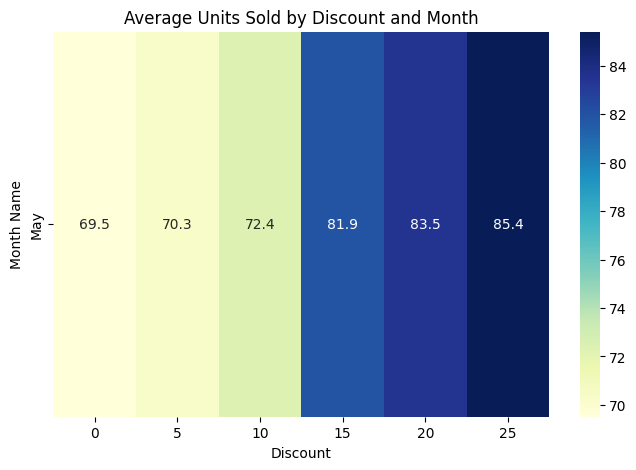

In [36]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 
               'July', 'August', 'September', 'October', 'November', 'December']

sales_data['Month Name'] = pd.Categorical(sales_data['Month Name'], categories=month_order, ordered=True)


pivot_df = sales_data.pivot_table(
    values='Units Sold',
    index='Month Name',
    columns='Discount',
    aggfunc='mean'
)

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
sns.heatmap(pivot_df, annot=True, fmt=".1f", cmap='YlGnBu')
plt.title('Average Units Sold by Discount and Month')
plt.show()


In [37]:
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(sales_data['Discount'], pd.cut(sales_data['Units Sold'], bins=[0, 25, 50, 75, 100, 200]))

# Chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f'Chi-squared test statistic: {chi2:.2f}, p-value: {p:.4f}')


Chi-squared test statistic: 1982.66, p-value: 0.0000


<Axes: xlabel='Units Sold', ylabel='Density'>

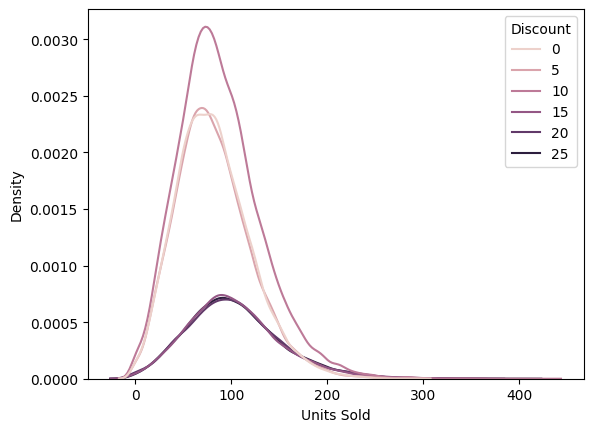

In [38]:
sns.kdeplot(data=sales_data, x='Units Sold', hue='Discount')


In [39]:
fig = px.line(daily_sales, x='Date', y='Units Sold', title='Daily Total Units Sold Over Time')
fig.show()

In [40]:
sales_data['Revenue'] = sales_data['Units Sold'] * sales_data['Price']


In [41]:
daily_revenue = sales_data.groupby('Date')['Revenue'].sum().reset_index()


In [42]:
import plotly.express as px

fig = px.line(daily_revenue, x='Date', y='Revenue', title='Daily Revenue Over Time')
fig.show()


In [43]:
from prophet import Prophet
# Prophet expects columns 'ds' and 'y'
df_prophet = daily_revenue.rename(columns={'Date': 'ds', 'Revenue': 'y'})


In [44]:
model = Prophet()

model.fit(df_prophet)


18:06:46 - cmdstanpy - INFO - Chain [1] start processing
18:06:46 - cmdstanpy - INFO - Chain [1] done processing


In [45]:
# Forecast next 60 days
future = model.make_future_dataframe(periods=60)

forecast = model.predict(future)


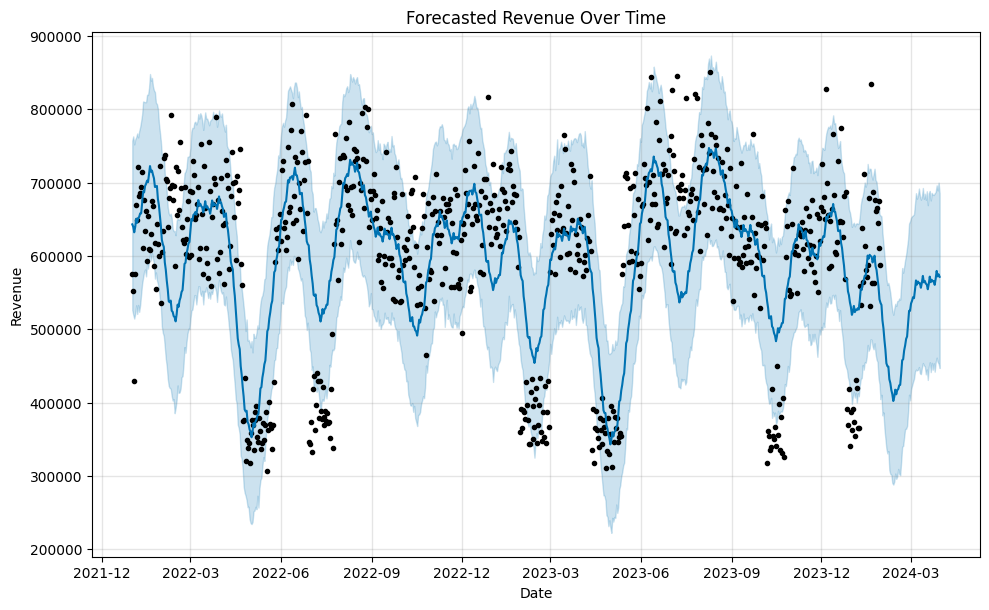

In [46]:
fig = model.plot(forecast)
plt.title('Forecasted Revenue Over Time')
plt.xlabel('Date')
plt.ylabel('Revenue')
plt.show()


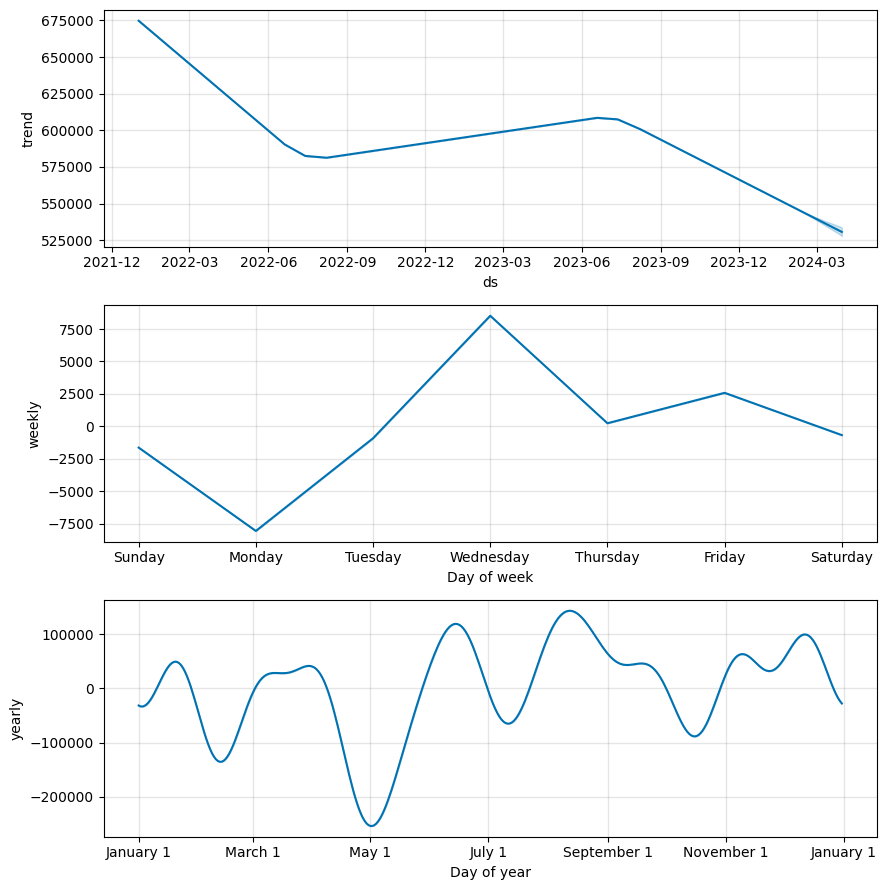

In [47]:
fig2 = model.plot_components(forecast)
plt.show()


In [49]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import plotly.express as px

# Aggregate store-level data
store_summary = sales_data.groupby('Store ID').agg({
    'Units Sold': 'sum',
    'Price': 'mean',
    'Discount': 'mean',
    'Revenue': 'sum'
}).reset_index()

# Scale numeric features for clustering
scaler = StandardScaler()
scaled_features = scaler.fit_transform(store_summary[['Units Sold', 'Price', 'Discount', 'Revenue']])


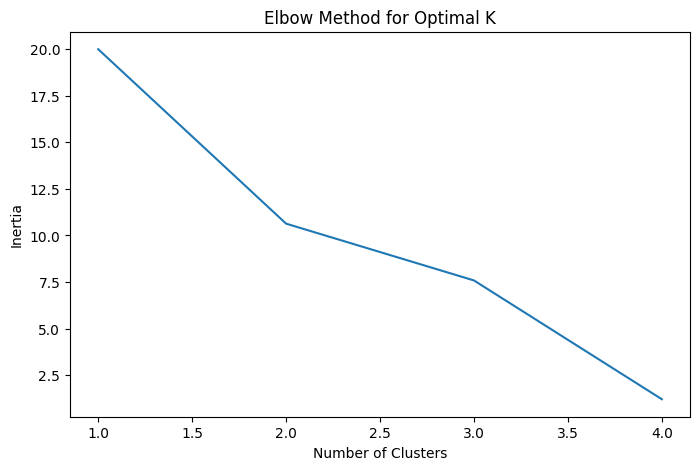

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns

# Test different cluster counts
inertia = []
K = range(1, 5)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_features)
    inertia.append(kmeans.inertia_)

# Plot elbow curve
plt.figure(figsize=(8, 5))
sns.lineplot(x=K, y=inertia)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.show()


In [52]:
kmeans = KMeans(n_clusters=3, random_state=42)
store_summary['Cluster'] = kmeans.fit_predict(scaled_features)


In [53]:
fig = px.scatter(store_summary, 
                 x='Units Sold', 
                 y='Revenue', 
                 color='Cluster', 
                 hover_data=['Store ID'],
                 title='Store Clusters by Units Sold and Revenue')
fig.show()


In [55]:
fig = px.scatter_3d(store_summary, 
                    x='Units Sold', 
                    y='Revenue', 
                    z='Price',
                    color='Cluster',
                    hover_data=['Store ID'],
                    title='3D Clustering of Stores')
fig.show()


In [57]:
sales_data.info()
sales_data.describe(include='all')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                76000 non-null  datetime64[ns]
 1   Store ID            76000 non-null  object        
 2   Product ID          76000 non-null  object        
 3   Category            76000 non-null  object        
 4   Region              76000 non-null  object        
 5   Inventory Level     76000 non-null  int64         
 6   Units Sold          76000 non-null  int64         
 7   Units Ordered       76000 non-null  int64         
 8   Price               76000 non-null  float64       
 9   Discount            76000 non-null  int64         
 10  Weather Condition   76000 non-null  object        
 11  Promotion           76000 non-null  int64         
 12  Competitor Pricing  76000 non-null  float64       
 13  Seasonality         76000 non-null  object    

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Price,Discount,Weather Condition,Promotion,Competitor Pricing,Seasonality,Epidemic,Demand,Year,Month,Week Ending,Month Ending,Month Name,Units Sold Bin,Revenue
count,76000,76000,76000,76000,76000,76000.000000,76000.000000,76000.000000,76000.000000,76000.000000,76000,76000.000000,76000.000000,76000,76000.000000,76000.000000,76000.000000,76000.000000,76000,76000,6200,74677,76000.000000
unique,NaN,5,20,5,4,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,NaN,1,5,NaN
top,NaN,S001,P0001,Groceries,North,NaN,NaN,NaN,NaN,NaN,Cloudy,NaN,NaN,Winter,NaN,NaN,NaN,NaN,NaN,NaN,May,101-200,NaN
freq,NaN,15200,3800,30400,30400,NaN,NaN,NaN,NaN,NaN,24360,NaN,NaN,21000,NaN,NaN,NaN,NaN,NaN,NaN,6200,25368,NaN
mean,2023-01-15 12:00:00,NaN,NaN,NaN,NaN,301.062842,88.827316,89.090645,67.726028,9.087039,NaN,0.328947,69.454029,NaN,0.200000,104.317158,2022.559211,6.307895,2023-01-19 12:05:41.052631296,2023-01-30 06:01:53.684210688,NaN,NaN,5990.790717
min,2022-01-01 00:00:00,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,4.740000,0.000000,NaN,0.000000,4.290000,NaN,0.000000,4.000000,2022.000000,1.000000,2022-01-02 00:00:00,2022-01-31 00:00:00,NaN,NaN,0.000000
25%,2022-07-09 18:00:00,NaN,NaN,NaN,NaN,136.000000,58.000000,0.000000,31.997500,5.000000,NaN,0.000000,32.620000,NaN,0.000000,71.000000,2022.000000,3.000000,2022-07-15 06:00:00,2022-07-31 00:00:00,NaN,NaN,2426.595000
50%,2023-01-15 12:00:00,NaN,NaN,NaN,NaN,227.000000,84.000000,0.000000,64.500000,10.000000,NaN,0.000000,65.700000,NaN,0.000000,100.000000,2023.000000,6.000000,2023-01-22 00:00:00,2023-01-31 00:00:00,NaN,NaN,4789.285000
75%,2023-07-24 06:00:00,NaN,NaN,NaN,NaN,408.000000,114.000000,121.000000,95.830000,10.000000,NaN,1.000000,97.932500,NaN,0.000000,133.000000,2023.000000,9.000000,2023-07-30 00:00:00,2023-07-31 00:00:00,NaN,NaN,8349.327500
max,2024-01-30 00:00:00,NaN,NaN,NaN,NaN,2267.000000,426.000000,1616.000000,228.030000,25.000000,NaN,1.000000,261.220000,NaN,1.000000,430.000000,2024.000000,12.000000,2024-02-04 00:00:00,2024-01-31 00:00:00,NaN,NaN,69859.740000


In [58]:
import pandas as pd
import numpy as np

# Set random seed for reproducibility
np.random.seed(42)

# Parameters
num_employees = 200
months = pd.date_range(start='2024-01-01', periods=12, freq='MS')

# Create records
data = []
for employee_id in range(1, num_employees + 1):
    for month in months:
        adherence = np.random.normal(loc=90, scale=5)
        adherence = np.clip(adherence, 70, 100)

        # Productivity influenced by adherence + some randomness
        productivity = np.random.normal(loc=50 + 0.8 * (adherence - 85), scale=5)
        productivity = np.clip(productivity, 20, 100)

        # Incentives based on productivity + randomness
        incentives = 200 + (productivity * np.random.uniform(8, 12)) + np.random.normal(0, 50)
        incentives = np.clip(incentives, 0, None)

        data.append([employee_id, month, adherence, productivity, incentives])

# Convert to DataFrame
df = pd.DataFrame(data, columns=['employee_id', 'month', 'adherence', 'productivity', 'incentives'])

# Check first few rows
print(df.head())


   employee_id      month  adherence  productivity  incentives
0            1 2024-01-01  92.483571     55.295535  748.674262
1            1 2024-02-01  91.594511     56.670815  864.400487
2            1 2024-03-01  87.652628     54.834903  649.991631
3            1 2024-04-01  85.379586     37.240924  588.828441
4            1 2024-05-01  84.935844     51.519912  637.197174


In [59]:
df

,employee_id,month,adherence,productivity,incentives
0,1,2024-01-01,92.483571,55.295535,748.674262
1,1,2024-02-01,91.594511,56.670815,864.400487
2,1,2024-03-01,87.652628,54.834903,649.991631
3,1,2024-04-01,85.379586,37.240924,588.828441
4,1,2024-05-01,84.935844,51.519912,637.197174
...,...,...,...,...,...
2395,200,2024-08-01,95.660991,60.357608,834.968487
2396,200,2024-09-01,100.000000,69.714034,719.018304
2397,200,2024-10-01,84.728475,56.917617,738.122386
2398,200,2024-11-01,89.291687,54.944964,742.588090


In [61]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# Set random seed
np.random.seed(42)

# Parameters
num_employees = 200
months = pd.date_range(start='2024-01-01', periods=12, freq='MS')

# Create data
data = []
for employee_id in range(1, num_employees + 1):
    for month in months:
        adherence = np.random.normal(90, 5)
        adherence = np.clip(adherence, 70, 100)
        
        productivity = np.random.normal(50 + 0.8 * (adherence - 85), 5)
        productivity = np.clip(productivity, 20, 100)

        incentives = 200 + productivity * np.random.uniform(8, 12) + np.random.normal(0, 50)
        incentives = max(incentives, 0)

        data.append([employee_id, month, adherence, productivity, incentives])

df = pd.DataFrame(data, columns=['employee_id', 'month', 'adherence', 'productivity', 'incentives'])

print(df.head())


   employee_id      month  adherence  productivity  incentives
0            1 2024-01-01  92.483571     55.295535  748.674262
1            1 2024-02-01  91.594511     56.670815  864.400487
2            1 2024-03-01  87.652628     54.834903  649.991631
3            1 2024-04-01  85.379586     37.240924  588.828441
4            1 2024-05-01  84.935844     51.519912  637.197174


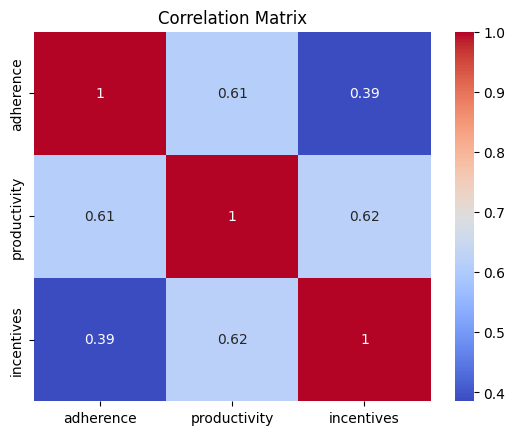

In [62]:
corr = df[['adherence', 'productivity', 'incentives']].corr()

sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


In [63]:
def run_regression(X_col, y_col):
    X = df[[X_col]].values
    y = df[y_col].values

    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    r2 = r2_score(y, y_pred)
    coef = model.coef_[0]
    intercept = model.intercept_

    print(f'Regression: {y_col} ~ {X_col}')
    print(f'Intercept: {intercept:.2f}')
    print(f'Coefficient: {coef:.2f}')
    print(f'R-squared: {r2:.3f}')
    print('-'*40)


In [64]:
run_regression('adherence', 'productivity')


Regression: productivity ~ adherence
Intercept: -17.26
Coefficient: 0.79
R-squared: 0.375
----------------------------------------


In [65]:
run_regression('productivity', 'incentives')


Regression: incentives ~ productivity
Intercept: 205.00
Coefficient: 9.84
R-squared: 0.383
----------------------------------------


In [66]:
run_regression('adherence', 'incentives')


Regression: incentives ~ adherence
Intercept: 23.02
Coefficient: 7.92
R-squared: 0.148
----------------------------------------


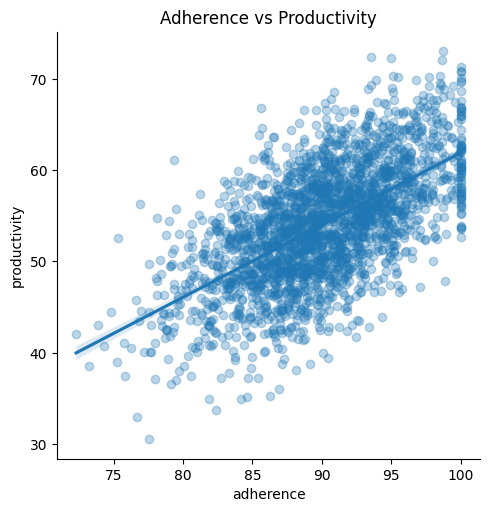

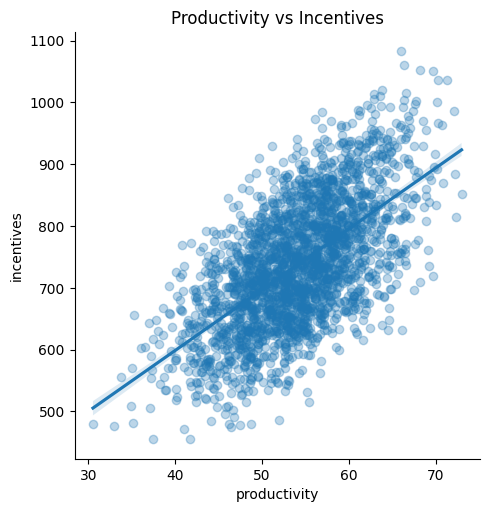

In [67]:
# Adherence vs Productivity
sns.lmplot(data=df, x='adherence', y='productivity', scatter_kws={'alpha':0.3})
plt.title('Adherence vs Productivity')
plt.show()

# Productivity vs Incentives
sns.lmplot(data=df, x='productivity', y='incentives', scatter_kws={'alpha':0.3})
plt.title('Productivity vs Incentives')
plt.show()


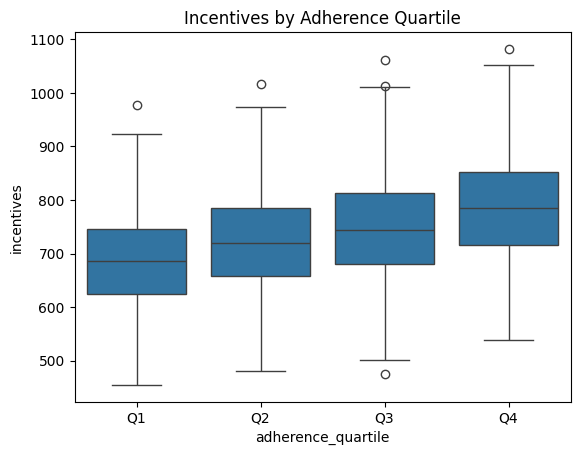

In [68]:
df['adherence_quartile'] = pd.qcut(df['adherence'], 4, labels=['Q1','Q2','Q3','Q4'])

sns.boxplot(data=df, x='adherence_quartile', y='incentives')
plt.title('Incentives by Adherence Quartile')
plt.show()
